In [4]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
### Initial imports
import logging
import numpy as np
import pandas as pd
import pymc3 as pm
import theano.tensor as T
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("ticks")

logging.basicConfig(level=logging.INFO)
log = logging.getLogger(__name__)

import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

from epimodel.pymc3_models import cm_effect
from epimodel.pymc3_models.cm_effect.datapreprocessor import DataPreprocessor, dataset_summary_plot

%matplotlib inline

import os
os.environ["THEANO_FLAGS"] = "mode=FAST_RUN,floatX=float32"

INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Performing Smoothing
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Albania
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Andorra
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Estonia
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Iceland
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Latvia
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Lithuania
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing New Zealand
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Singapore
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Slovakia
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Performing Masking


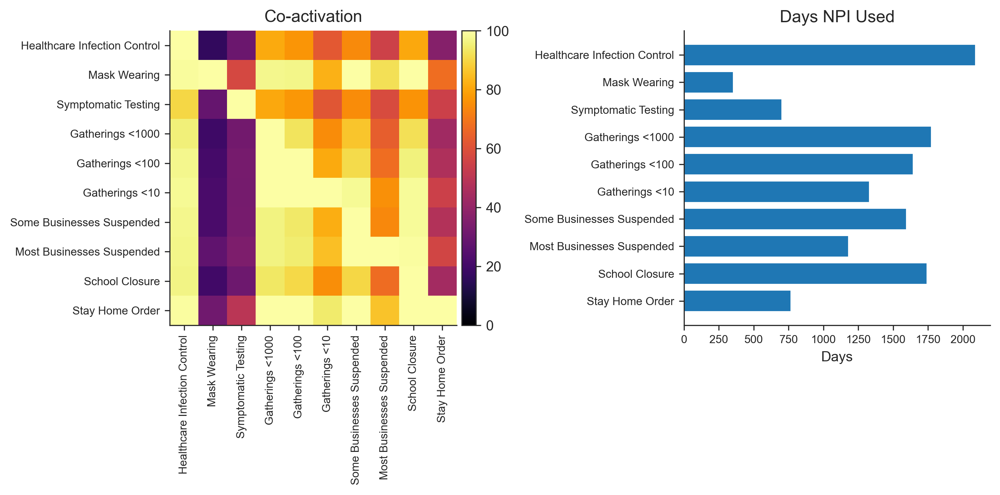

In [6]:
dp = DataPreprocessor()
data = dp.preprocess_data("data_final.csv")

In [7]:
# data.ignore_early_features()

In [8]:
data.filter_region_min_deaths(500)

Region AL removed since it has 27.0 deaths on the last day
Region AD removed since it has 40.0 deaths on the last day
Region BA removed since it has 57.0 deaths on the last day
Region BG removed since it has 55.0 deaths on the last day
Region HR removed since it has 54.0 deaths on the last day
Region CZ removed since it has 218.0 deaths on the last day
Region DK removed since it has 418.0 deaths on the last day
Region EE removed since it has 46.0 deaths on the last day
Region FI removed since it has 186.0 deaths on the last day
Region GE removed since it has 0.0 deaths on the last day
Region GR removed since it has 130.0 deaths on the last day
Region HU removed since it has 262.0 deaths on the last day
Region IS removed since it has 10.0 deaths on the last day
Region IL removed since it has 199.0 deaths on the last day
Region LV removed since it has 12.0 deaths on the last day
Region LT removed since it has 41.0 deaths on the last day
Region MY removed since it has 98.0 deaths on the l

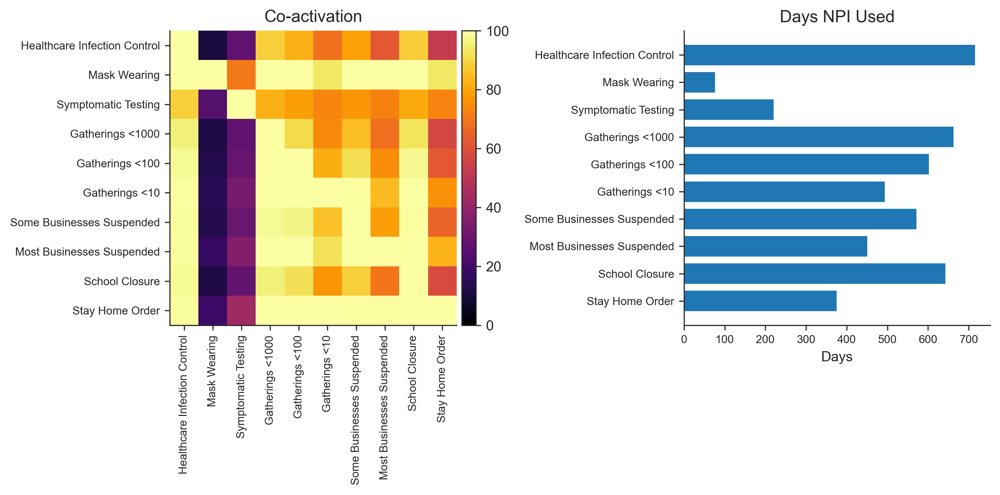

In [9]:
dataset_summary_plot(data.CMs, data.ActiveCMs)

In [10]:
with cm_effect.models.CMDeath_Final_ICL(data) as model:
    model.build_model()

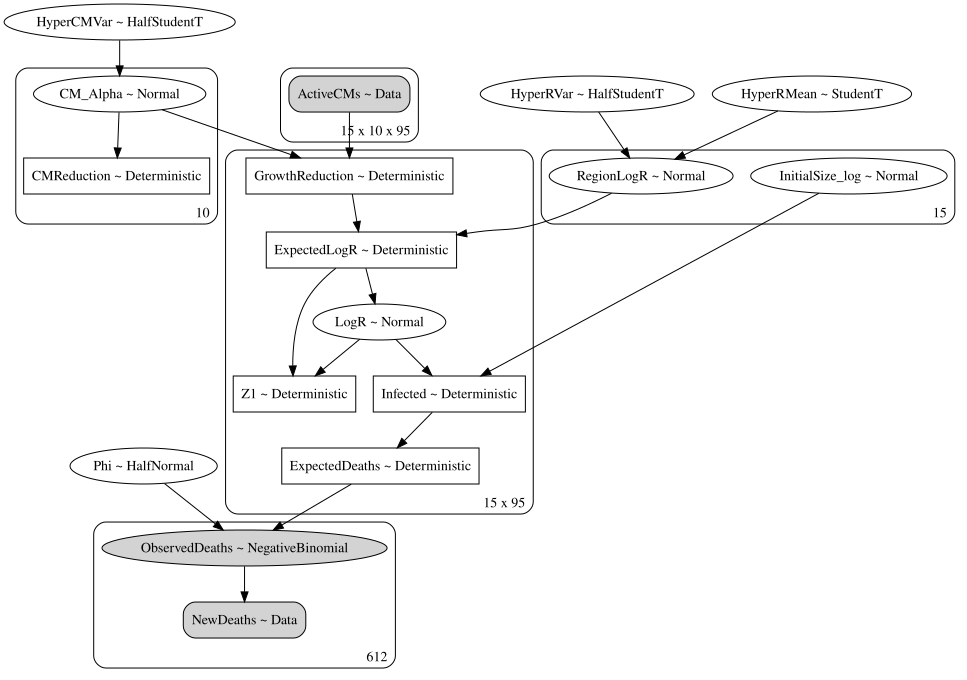

In [11]:
pm.model_to_graphviz(model).render("model-combined-final-ICL")
pm.model_to_graphviz(model)

mean: 3.327279651955401, std: 0.7555498513475881


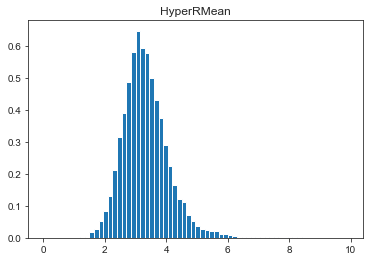

In [173]:
nSamples = 10000
samples = np.exp(model.HyperRMean.random(size=nSamples))
plt.hist(samples, bins=np.arange(0, 10, 0.15), density=True)
plt.title("HyperRMean")
print(f"mean: {np.mean(samples)}, std: {np.std(samples)}")

mean: 0.1737368563534675, std: 0.14249970605813925


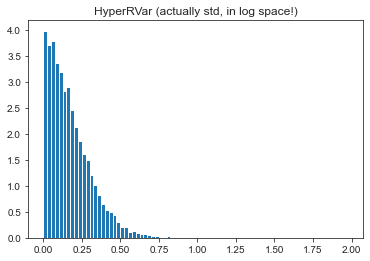

In [174]:
nSamples = 10000
samples = model.HyperRVar.random(size=nSamples)
plt.hist(samples, bins=np.arange(0, 2, 0.025), density=True)
plt.title("HyperRVar (actually std, in log space!)")
print(f"mean: {np.mean(samples)}, std: {np.std(samples)}")

mean: 0.08638175732187409, std: 0.07158398523016976


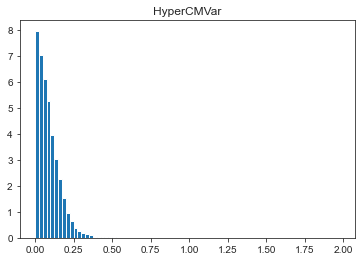

In [175]:
nSamples = 10000
samples = model.HyperCMVar.random(size=nSamples)
plt.hist(samples, bins=np.arange(0, 2, 0.025), density=True)
plt.title("HyperCMVar")
print(f"mean: {np.mean(samples)}, std: {np.std(samples)}")

mean: -3.808131302484749, std: 30.387661791260925


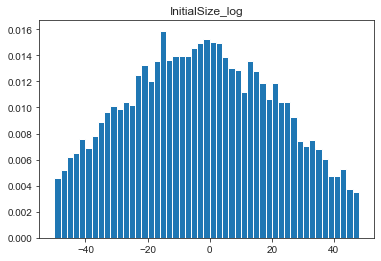

In [176]:
nSamples = 10000
samples = model.InitialSize_log.random(size=nSamples)[:, 7]
plt.hist(samples, bins=np.arange(-50, 50, 2), density=True)
plt.title("InitialSize_log")
print(f"mean: {np.mean(samples)}, std: {np.std(samples)}")

mean: 3.424758115250655, std: 1.3097208696381641


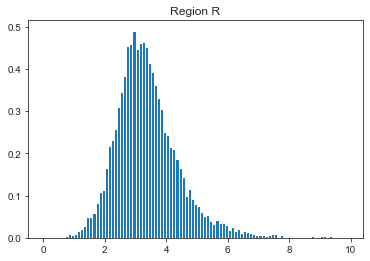

In [177]:
nSamples = 10000
samples = np.exp(model.RegionLogR.random(size=nSamples))[:, 0]
plt.hist(samples, bins=np.arange(0, 10, 0.1), density=True)
plt.title("Region R")
print(f"mean: {np.mean(samples)}, std: {np.std(samples)}")

mean: 3.999583738392302, std: 2.995065216098793


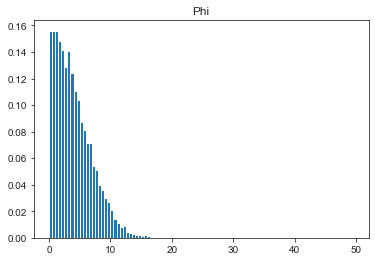

In [178]:
nSamples = 10000
samples = model.Phi.random(size=nSamples)
plt.hist(samples, bins=np.arange(0, 50, 0.5), density=True)
plt.title("Phi")
print(f"mean: {np.mean(samples)}, std: {np.std(samples)}")

mean: 2.1879201781365025, std: 48.356625099484305


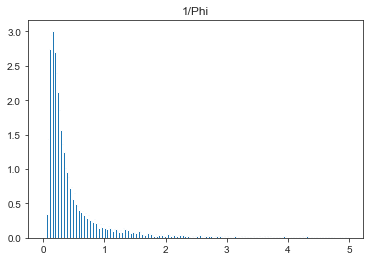

In [179]:
nSamples = 10000
samples = 1/model.Phi.random(size=nSamples)
plt.hist(samples, bins=np.arange(0, 5, 0.025), density=True)
plt.title("1/Phi")
print(f"mean: {np.mean(samples)}, std: {np.std(samples)}")

mean: -0.5097033011024328, std: 11.294111468094965


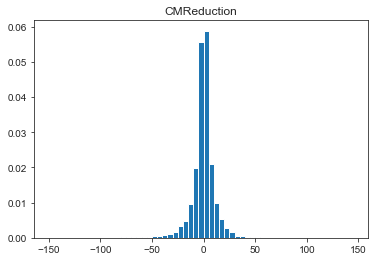

In [180]:
nSamples = 10000
samples = 100*(1-np.exp(-model.CM_Alpha.random(size=nSamples)))[:, 0]
plt.hist(samples, bins=np.arange(-150, 150, 5), density=True)
plt.title("CMReduction")
print(f"mean: {np.mean(samples)}, std: {np.std(samples)}")

In [12]:
with model.model:
    model.trace = pm.sample(2000, chains=2, target_accept=0.95)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 4 jobs)
NUTS: [Phi, InitialSize_log, LogR, RegionLogR, HyperRVar, HyperRMean, CM_Alpha, HyperCMVar]
INFO:pymc3:NUTS: [Phi, InitialSize_log, LogR, RegionLogR, HyperRVar, HyperRMean, CM_Alpha, HyperCMVar]
Sampling 2 chains, 0 divergences: 100%|██████████| 5000/5000 [1:20:12<00:00,  1.04draws/s]
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
INFO:pymc3:The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.
ERROR:pymc3:The estimated number of effective samples is smaller than 200 for some parameters.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x14151d550>,
      dtype=object)

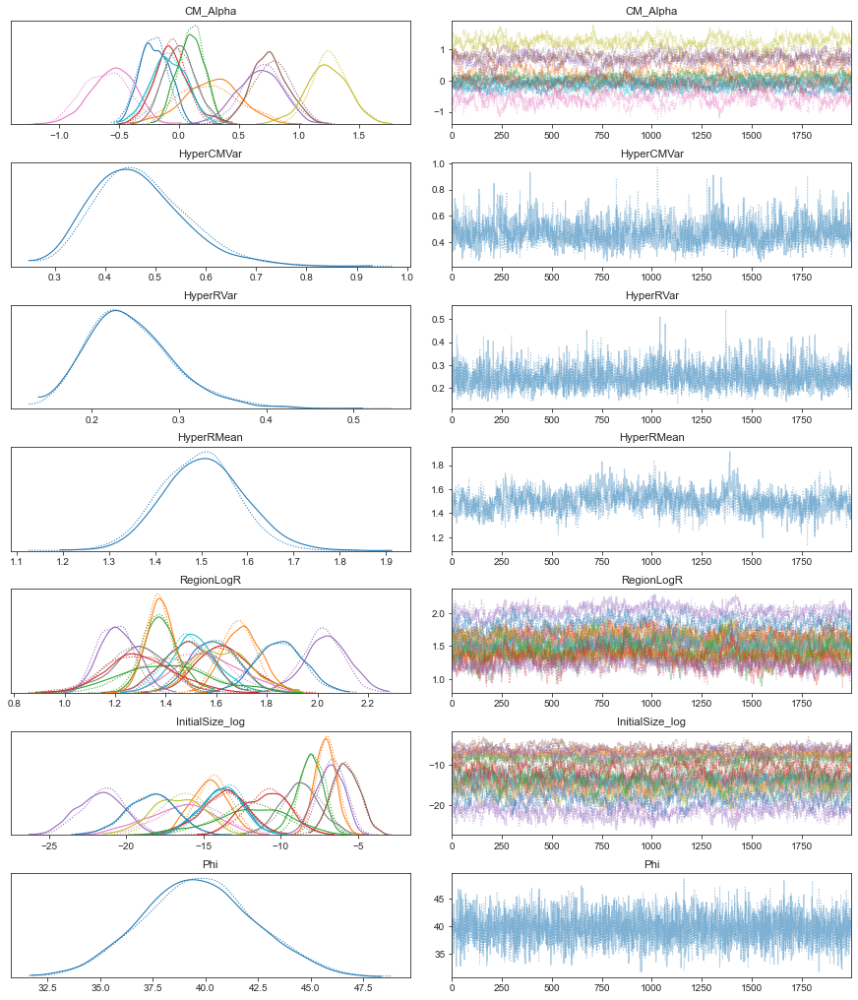

In [13]:
pm.traceplot(model.trace, ["CM_Alpha", "HyperCMVar", "HyperRVar", "HyperRMean", "RegionLogR", "InitialSize_log", "Phi"])

In [29]:
np.exp(-model.trace["CM_Alpha"])[:, 6]

array([1.86345295, 1.69290626, 1.88802835, ..., 1.69471085, 1.45697071,
       1.49523757])

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 18-05;14-58
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 18-05;14-58


<Figure size 2100x900 with 0 Axes>

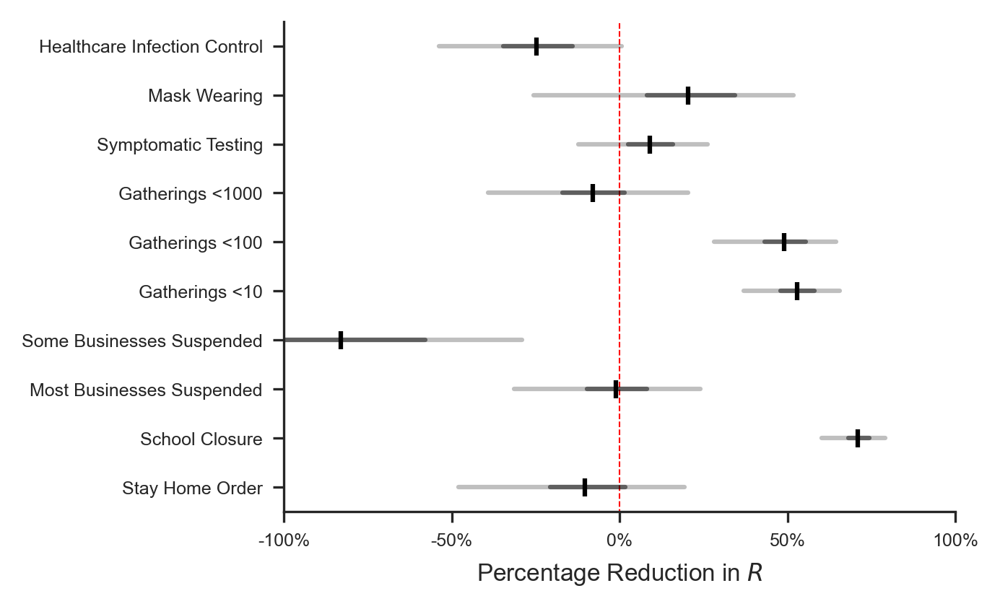

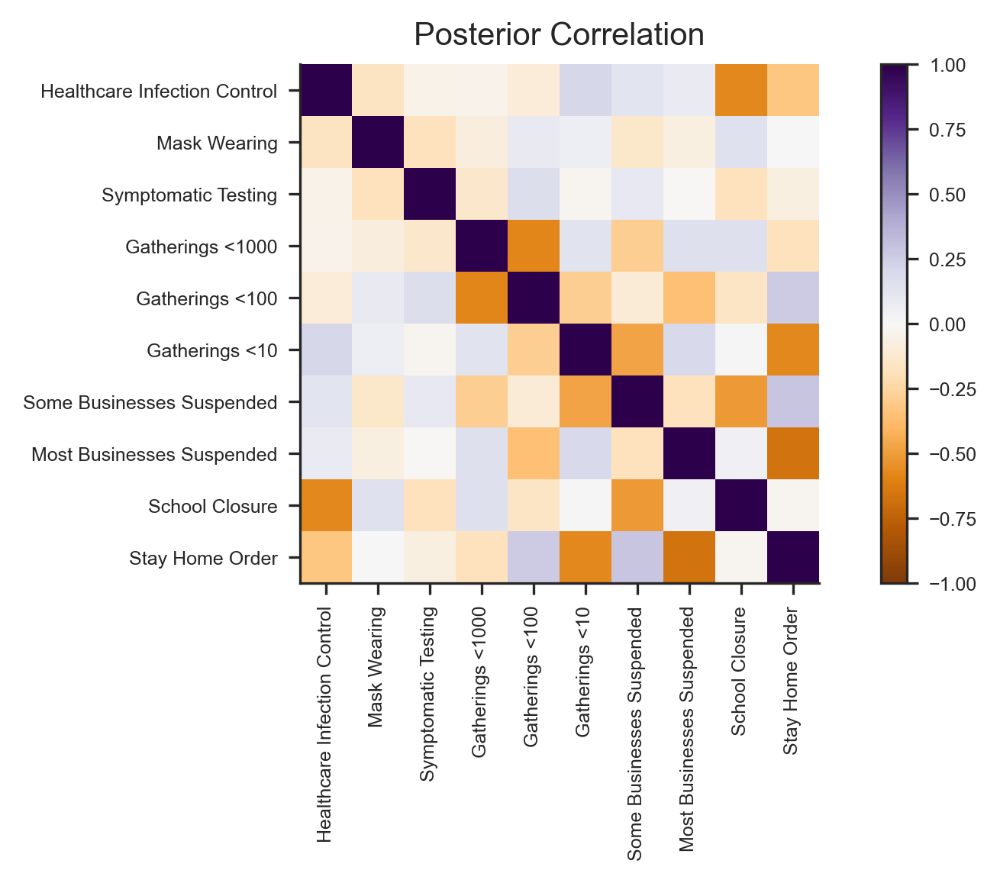

In [14]:
model.plot_effect()

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 18-05;14-59
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 18-05;14-59
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 18-05;14-59


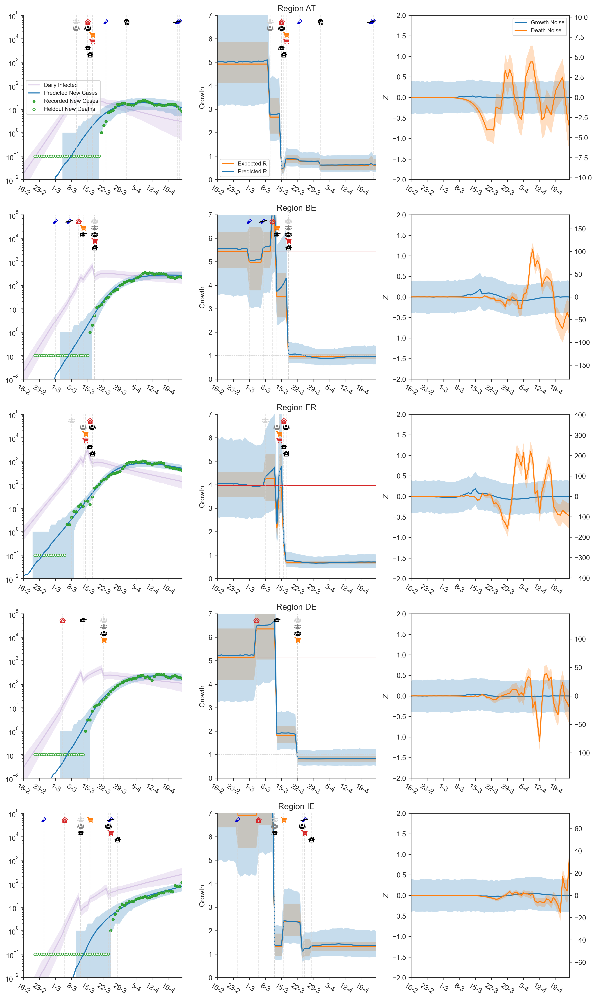

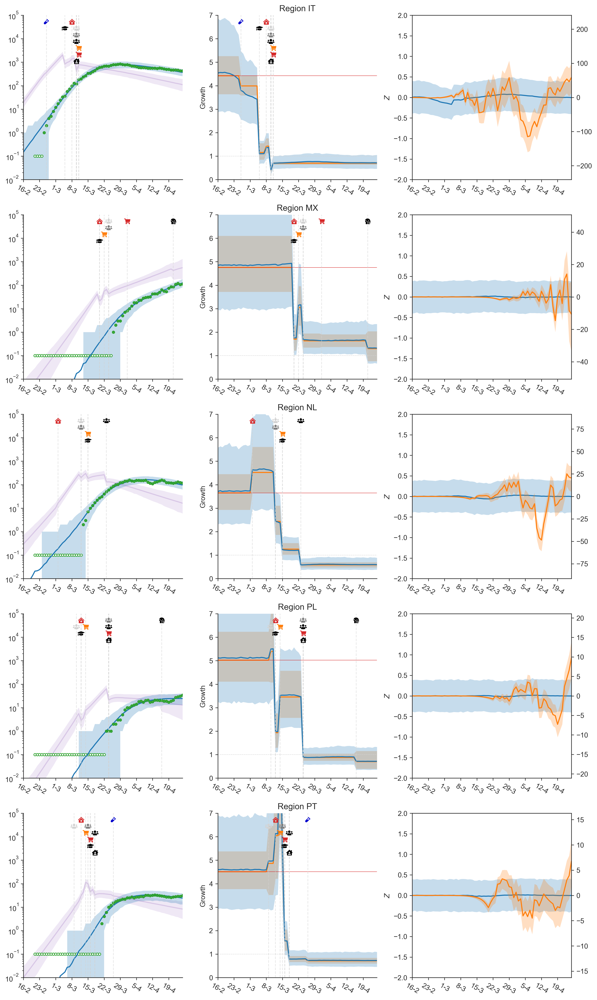

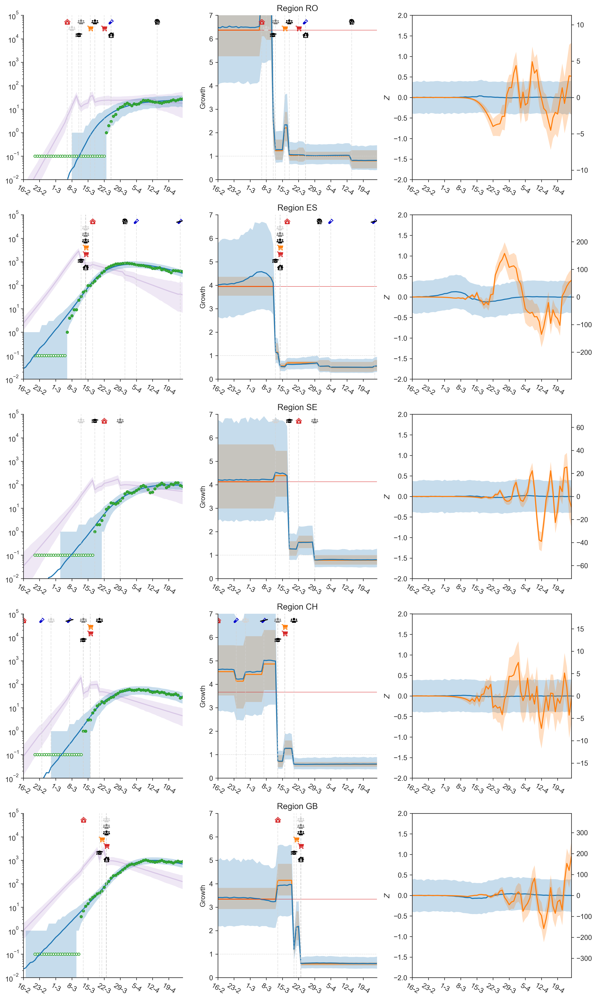

In [15]:
cm_plot_style = [
            ("\uf7f2", "tab:red"), # hospital symbol
            ("\uf963", "black"), # mask
            ("\uf492", "mediumblue"), # vial
            ("\uf0c0", "lightgrey"), # ppl
            ("\uf0c0", "grey"), # ppl
            ("\uf0c0", "black"), # ppl
            ("\uf07a", "tab:orange"), # shop 1
            ("\uf07a", "tab:red"), # shop2 
            ("\uf19d", "black"), # school
            ("\uf965", "black") # home
        ]

model.plot_region_predictions(cm_plot_style)

In [31]:
# changes: fix Phi=15, remove growth noise scale. 

with cm_effect.models.CMDeath_Final_ICL(data) as model2:
    model2.build_model()
    
with model2.model:
    model2.trace = pm.sample(2000, chains=2, target_accept=0.95)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 4 jobs)
NUTS: [Phi, InitialSize_log, RegionLogR, HyperRVar, HyperRMean, CM_Alpha, HyperCMVar]
INFO:pymc3:NUTS: [Phi, InitialSize_log, RegionLogR, HyperRVar, HyperRMean, CM_Alpha, HyperCMVar]
Sampling 2 chains, 0 divergences: 100%|██████████| 5000/5000 [1:50:53<00:00,  1.33s/draws]  
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.


INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 19-05;15-21
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 19-05;15-21


<Figure size 2100x900 with 0 Axes>

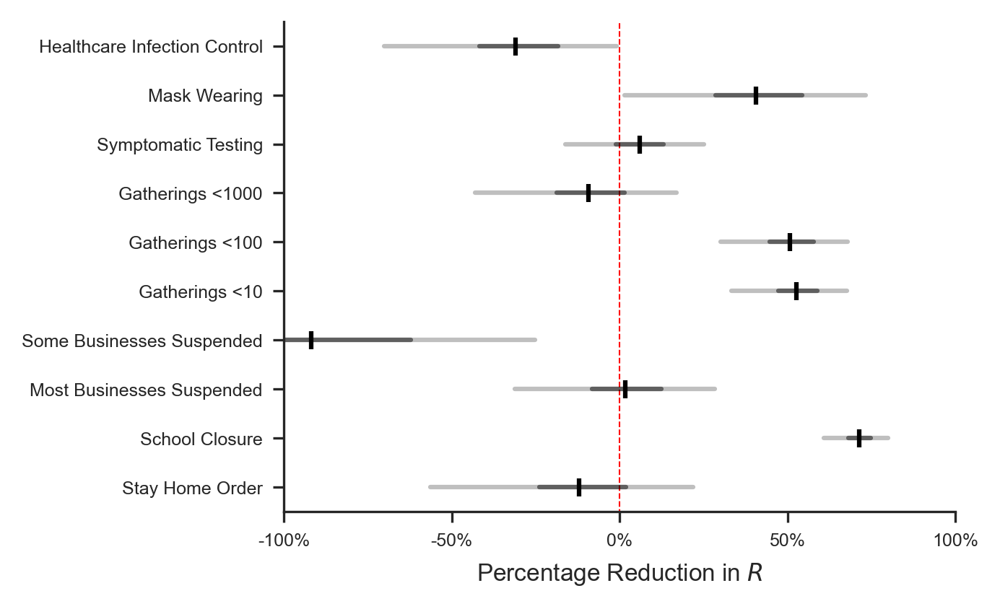

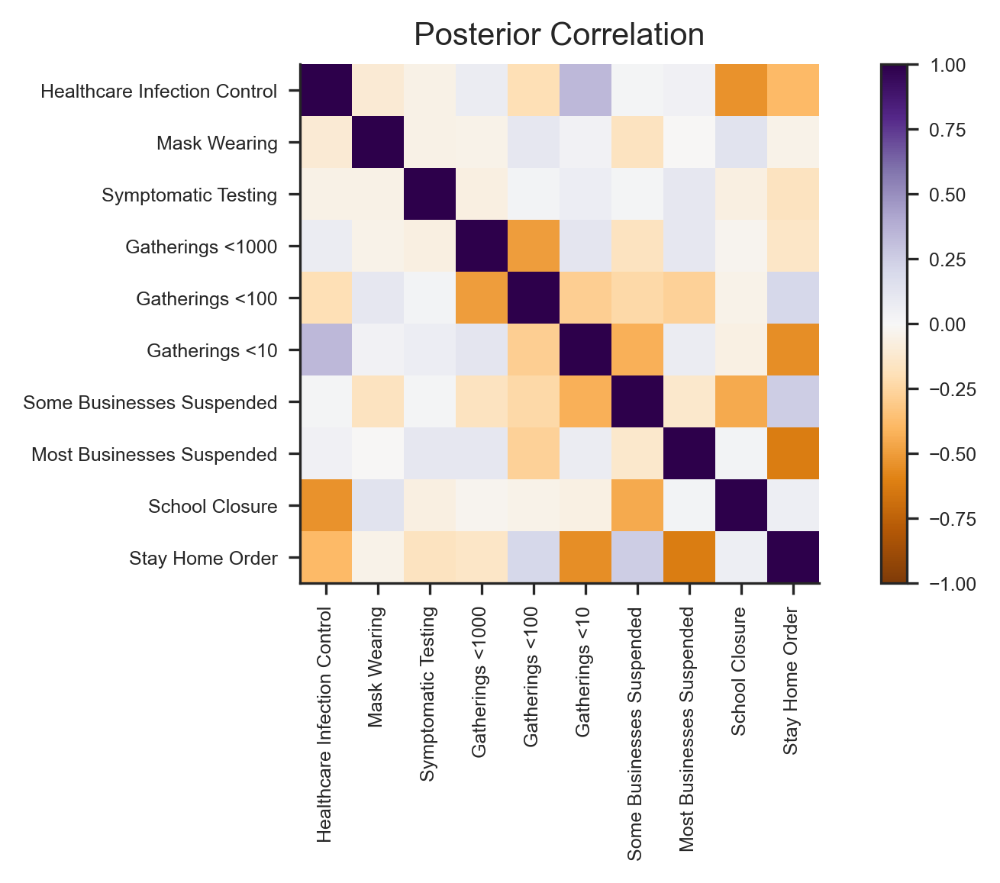

In [33]:
model2.plot_effect()

In [83]:
import pickle
pickle.dump(model.trace, open("death_icl.pkl", "wb" ) )

# compare the fits for the ICL model and our previous model.

In [84]:
import pickle
orig_trace = pickle.load(open("death.pkl", "rb" ))
icl_trace = pickle.load(open("death_icl.pkl", "rb" ))

We'll do the plotting in notebook. Let's set up some helper functions. 

In [116]:
from matplotlib.font_manager import FontProperties
fp2 = FontProperties(fname=r"../../fonts/Font Awesome 5 Free-Solid-900.otf")

import seaborn as sns
sns.set_style("ticks")

def add_cms_to_plot(ax, ActiveCMs, country_indx, min_x, max_x, days, plot_style):
    ax2 = ax.twinx()
    plt.ylim([0, 1])
    plt.xlim([min_x, max_x])
    CMs = ActiveCMs[country_indx, :, :]
    nCMs, _ = CMs.shape
    CM_changes = np.zeros((nCMs, len(days)))
    CM_changes[:, 1:] = CMs[:, 1:] - CMs[:, :-1]
    all_CM_changes = np.sum(CM_changes, axis=0)
    all_heights = np.zeros(all_CM_changes.shape)

    for cm in range(nCMs):
        changes = np.nonzero(CM_changes[cm, :])[0].tolist()
        height = 1
        for c in changes:
            close_heights = all_heights[c - 3:c + 4]
            if len(close_heights) == 7:
                height = np.max(close_heights) + 1
                all_heights[c] = height

            plt.plot(
                [c, c],
                [0, 1],
                "--",
                color="lightgrey",
                linewidth=1,
                zorder=-2,
                alpha=0.5
            )
            plot_height = 1 - (0.04 * height)

            if c < min_x:
                c_p = min_x
            else:
                c_p = c

            if CM_changes[cm, c] == 1:
                plt.text(c_p, plot_height, plot_style[cm][0], fontproperties=fp2, color=plot_style[cm][1], size=6,
                         va='center', ha='center', clip_on=True, zorder=1)
            else:
                plt.text(c_p, plot_height, plot_style[cm][0], fontproperties=fp2, color=plot_style[cm][1], size=6,
                         va='center', ha='center', clip_on=True, zorder=1)
                plt.plot([c_p - 1.5, c + 1.5], [plot_height - 0.005, plot_height + 0.005], color="black", zorder=2)

    plt.yticks([])
    return ax2

def produce_CIs(data):
    med = np.median(data, axis=0)
    li = np.percentile(data, 2.5, axis=0)
    ui = np.percentile(data, 97.5, axis=0)
    err = np.array([med - li, ui - med])
    return med, li, ui, err

cm_plot_style = [
            ("\uf7f2", "tab:red"), # hospital symbol
            ("\uf963", "black"), # mask
            ("\uf492", "mediumblue"), # vial
            ("\uf0c0", "lightgrey"), # ppl
            ("\uf0c0", "grey"), # ppl
            ("\uf0c0", "black"), # ppl
            ("\uf07a", "tab:orange"), # shop 1
            ("\uf07a", "tab:red"), # shop2 
            ("\uf19d", "black"), # school
            ("\uf965", "black") # home
        ]


In [161]:
country_indx = 0

def country_comparison_plot(country_indx):
    fig = plt.figure(figsize=(9, 3), dpi=300)
    
    def axis_fmt(ax):
        locs = np.arange(min_x, max_x, 7)
        xlabels = [f"{days[ts].day}-{days[ts].month}" for ts in locs]
        plt.xticks(locs, xlabels, rotation=-30)
        add_cms_to_plot(ax, data.ActiveCMs, country_indx, min_x, max_x, days, cm_plot_style)

    days = data.Ds
    days_x = np.arange(len(days))

    min_x = 25
    max_x = len(days) - 1

    # num infected
    plt.subplot(131)
    med_icl, lu_icl, up_icl, err_icl = produce_CIs(icl_trace["Infected"][:, country_indx, :])
    med_orig, lu_orig, up_orig, err_orig = produce_CIs(orig_trace["Infected"][:, country_indx, :])

    plt.plot(days_x, med_icl, color="tab:blue", label="ICL")
    plt.plot(days_x, med_orig, color="tab:red", label="Original")
    plt.fill_between(days_x, lu_icl, up_icl, alpha=0.15, color="tab:blue", linewidth=0)
    plt.fill_between(days_x, lu_orig, up_orig, alpha=0.15, color="tab:red", linewidth=0)

    plt.legend(fontsize=6)
    ax = plt.gca()
    ax.set_yscale("log")
    plt.xlim([min_x, max_x])
    plt.ylim([10 ** -2, 10 ** 5])
    plt.title("Daily Num Infected", fontsize=10)
    axis_fmt(ax)

    # Expected Deaths
    plt.subplot(132)
    med_icl, lu_icl, up_icl, err_icl = produce_CIs(icl_trace["ExpectedDeaths"][:, country_indx, :])
    med_orig, lu_orig, up_orig, err_orig = produce_CIs(orig_trace["ExpectedDeaths"][:, country_indx, :])
    plt.plot(days_x, med_icl, color="tab:blue", label="ICL")
    plt.plot(days_x, med_orig, color="tab:red", label="Original")
    plt.fill_between(days_x, lu_icl, up_icl, alpha=0.15, color="tab:blue", linewidth=0)
    plt.fill_between(days_x, lu_orig, up_orig, alpha=0.15, color="tab:red", linewidth=0)
    plt.scatter(days_x, data.NewDeaths[country_indx, :], marker="o", s=5, color="k")
    axis_fmt(plt.gca())
    plt.title(f"Deaths: {data.RNames[data.Rs[country_indx]][0]}", fontsize=10)

    # R
    plt.subplot(133)
    # base R
    med_icl, lu_icl, up_icl, err_icl = produce_CIs(np.exp(icl_trace.RegionLogR[:, country_indx]))
    med_orig, lu_orig, up_orig, err_orig = produce_CIs(np.exp(orig_trace.RegionLogR[:, country_indx]))
    plt.plot([min_x, max_x], [med_icl, med_icl], "--", color="tab:blue", linewidth=0.5)
    plt.plot([min_x, max_x], [med_orig, med_orig], "--", color="tab:red", linewidth=0.5)   
    plt.fill_between(days_x, lu_icl, up_icl, alpha=0.05, color="tab:blue", linewidth=0)
    plt.fill_between(days_x, lu_orig, up_orig, alpha=0.05, color="tab:red", linewidth=0)

    med_icl, lu_icl, up_icl, err_icl = produce_CIs(np.exp(icl_trace["ExpectedLogR"][:, country_indx, :]))
    med_orig, lu_orig, up_orig, err_orig = produce_CIs(np.exp(orig_trace["ExpectedLogR"][:, country_indx, :]))
    plt.plot(days_x, med_icl, color="tab:blue", label="ICL")
    plt.plot(days_x, med_orig, color="tab:red", label="Original")
    plt.fill_between(days_x, lu_icl, up_icl, alpha=0.15, color="tab:blue", linewidth=0)
    plt.fill_between(days_x, lu_orig, up_orig, alpha=0.15, color="tab:red", linewidth=0)
    axis_fmt(plt.gca())
    plt.title("R", fontsize=10)

    plt.tight_layout()
    sns.despine()

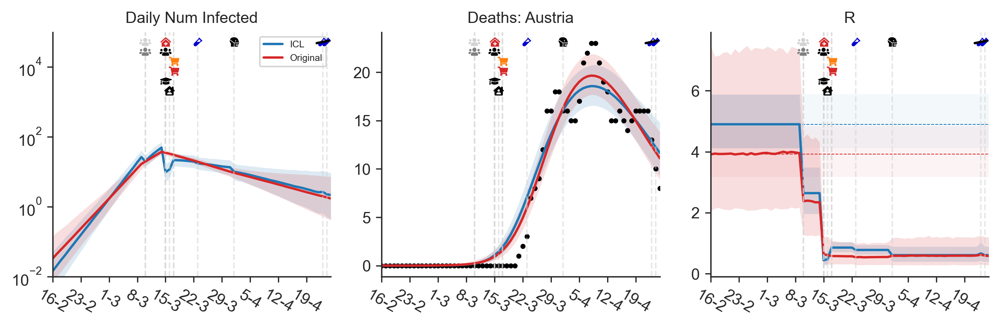

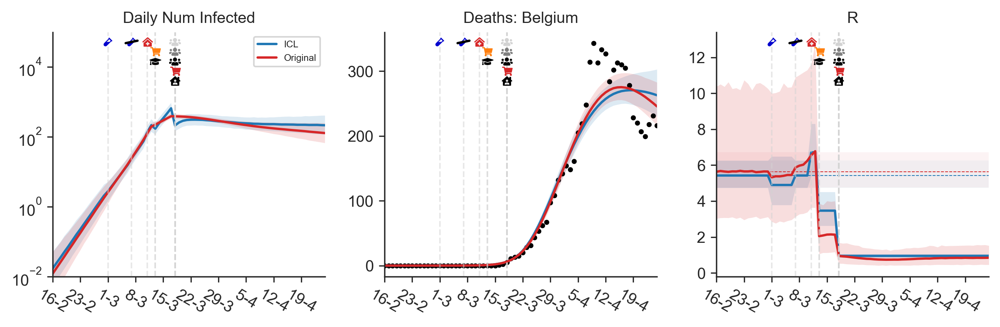

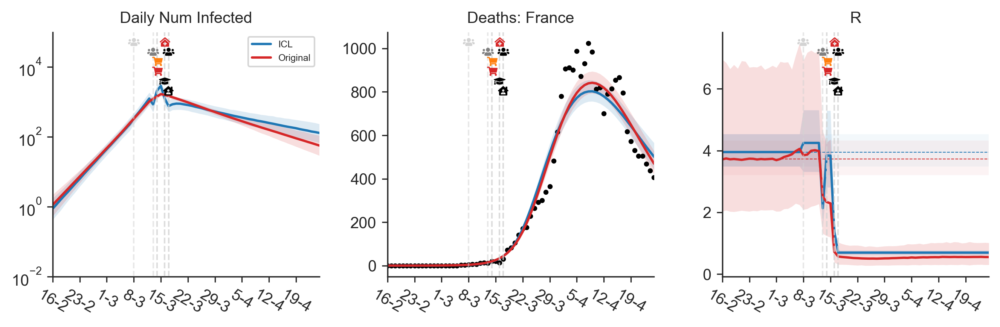

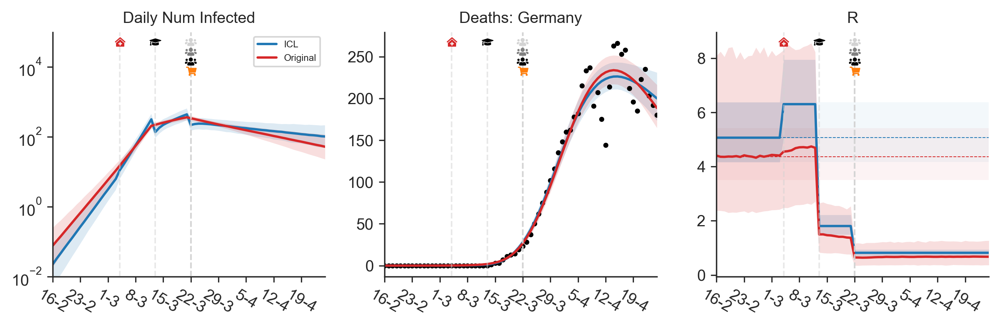

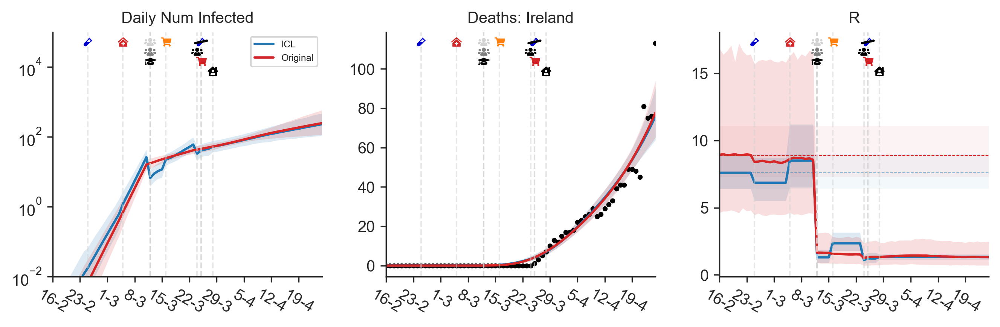

...

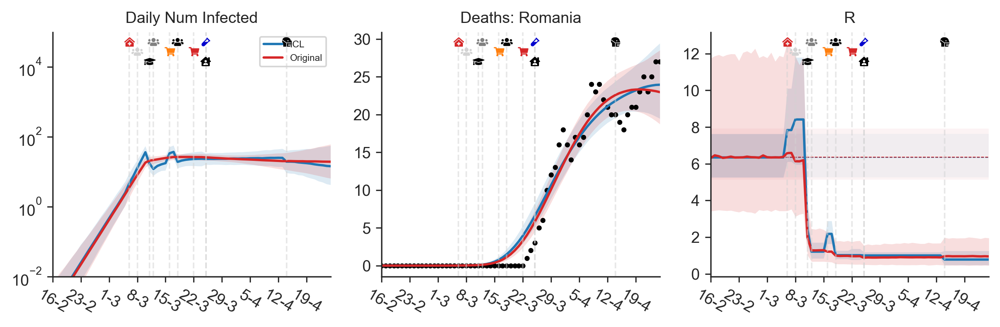

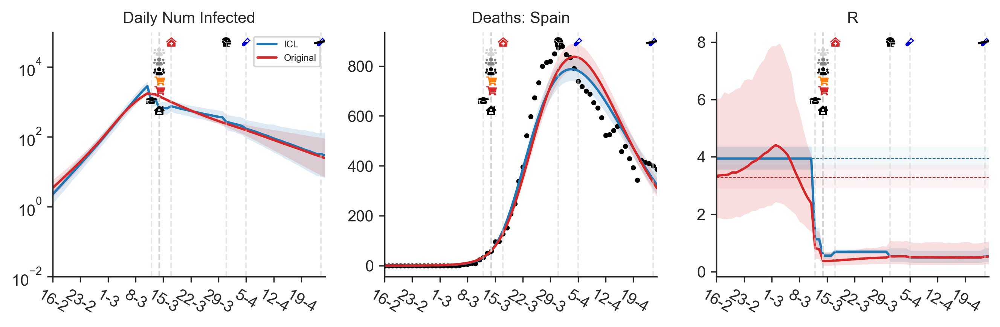

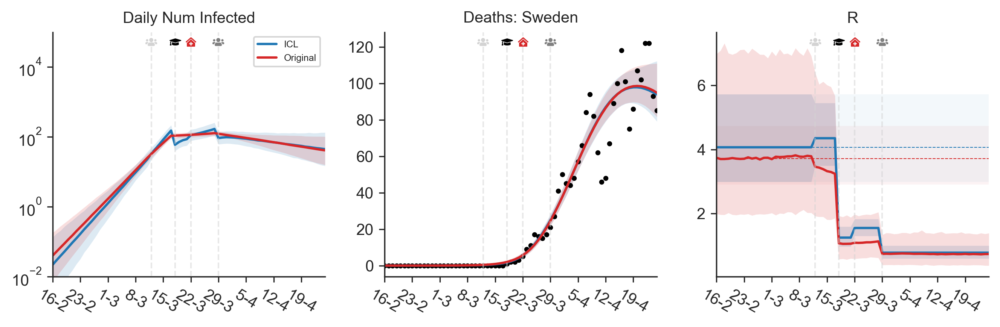

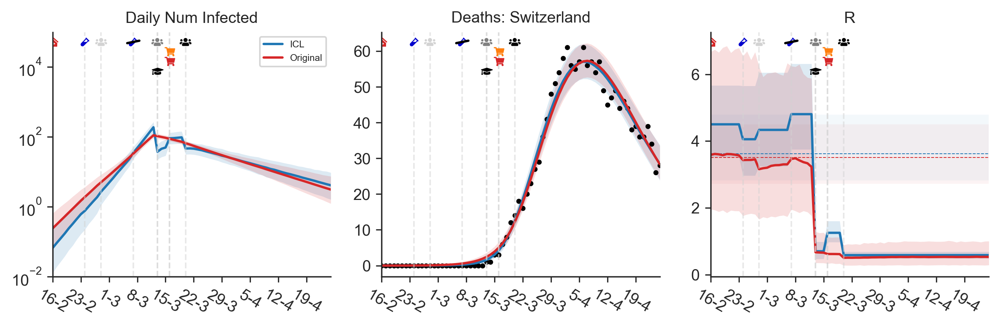

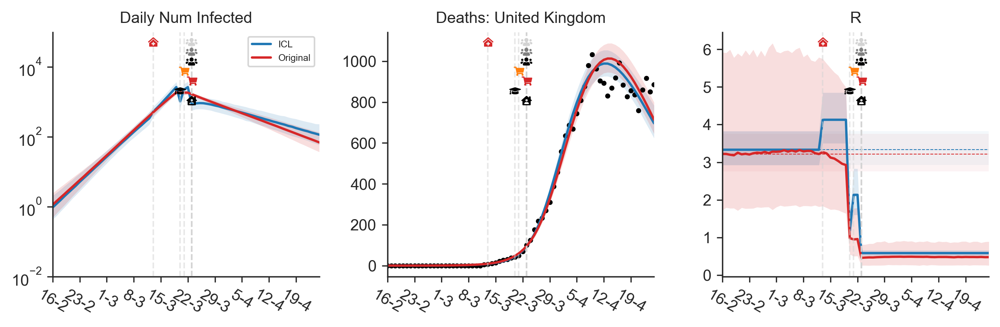

In [162]:
for r in range(len(data.Rs)):
    country_comparison_plot(r)

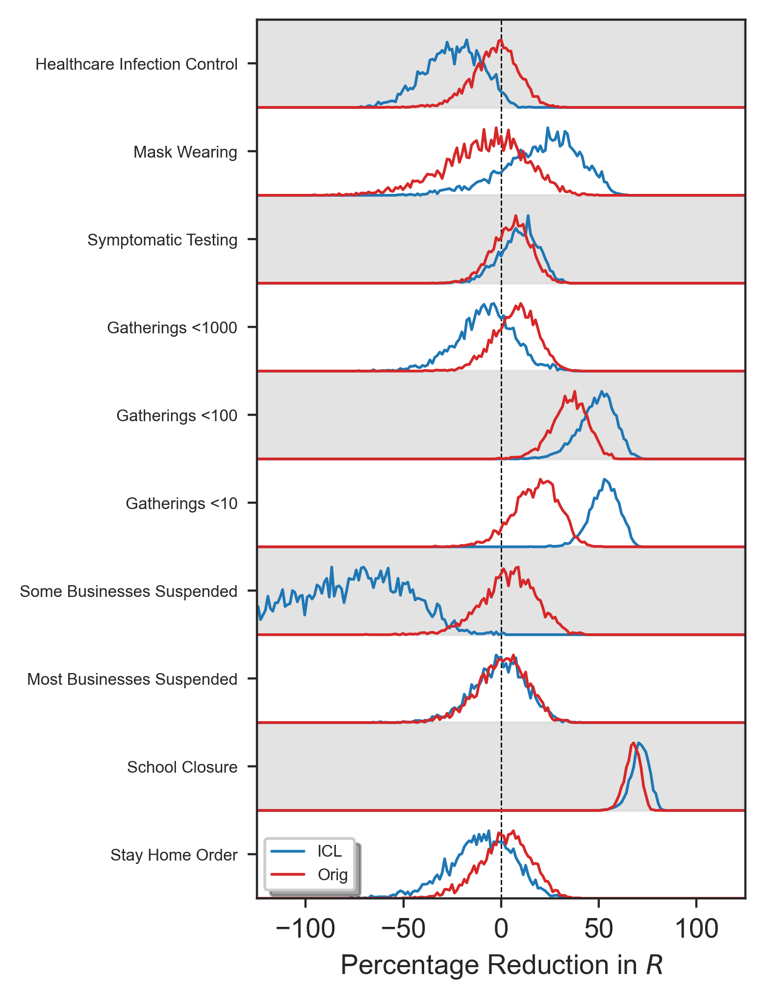

In [172]:
nCMs = len(data.CMs)
icl_cm_red = 100*(1 - icl_trace["CMReduction"])
orig_cm_red = 100*(1 - orig_trace["CMReduction"])

plt.figure(figsize=(4, 5), dpi=400)
y_vals = -1 * np.arange(nCMs) - 0.5
x_min = -125
x_max = 125

bin_edges = np.linspace(x_min, x_max, 200)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2

plt.plot([0, 0], [0.5, -nCMs+0.5], "--", color="black", linewidth=0.5)
for height in range(0, nCMs, 2):
    plt.fill_between(bin_centers, -(height-0.5)* np.ones_like(bin_centers), -(height+0.5)* np.ones_like(bin_centers), color="gainsboro", alpha=0.8)


for cm in range(nCMs):
    hist_death_R_icl, _ = np.histogram(icl_cm_red[:, cm], bins=bin_edges)
    hist_death_R_icl = hist_death_R_icl / (1.3 * np.max(hist_death_R_icl))
    hist_death_R_orig, _ = np.histogram(orig_cm_red[:, cm], bins=bin_edges)
    hist_death_R_orig = hist_death_R_orig / (1.3 * np.max(hist_death_R_orig))
    
    if cm == 0:
        plt.plot(bin_centers, hist_death_R_icl + y_vals[cm], color="tab:blue", label="ICL", linewidth=1)
        plt.plot(bin_centers, hist_death_R_orig + y_vals[cm], color="tab:red", label="Orig", linewidth=1)
    else:
        plt.plot(bin_centers, hist_death_R_icl + y_vals[cm], color="tab:blue", linewidth=1)
        plt.plot(bin_centers, hist_death_R_orig + y_vals[cm], color="tab:red", linewidth=1)

plt.ylim([-nCMs+0.5, 0.5])
plt.yticks(-1 * np.arange(nCMs), data.CMs, fontsize=6)
plt.xlim([x_min, x_max])
plt.legend(fontsize=6, shadow=True, fancybox=True, loc="lower left")
plt.tight_layout()
plt.xlabel("Percentage Reduction in $R$")
plt.savefig("comparison.pdf")